In [1]:

import pygame
import random
import os
import time
import numpy as np
import math
import torch
import torch.nn.functional
import matplotlib.pyplot as plt
import torch.optim as opt
from torch.autograd import Variable
from sklearn.model_selection import train_test_split

import scipy.stats as st
from sklearn.datasets.samples_generator import make_blobs
from matplotlib.colors import LogNorm 
import matplotlib.cm as cm
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from scipy.interpolate import griddata
import torch.nn.functional as F
import torch.distributions as D
if torch.cuda.is_available():  
    dev = "cuda:0" 
else:  
    dev = "cpu"  

print(dev)



pygame 2.0.1 (SDL 2.0.14, Python 3.8.3)
Hello from the pygame community. https://www.pygame.org/contribute.html


D:\ComputerSoftwares\Anaconda\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.datasets.samples_generator module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.datasets. Anything that cannot be imported from sklearn.datasets is now part of the private API.
  warnings.warn(message, FutureWarning)


cuda:0


In [2]:
global temp_list
temp_list = []
Agent_number_n=3;
Alpha = 1.0;

echo = 5
BATCH_SIZE = 64
LR = 0.001           # learning rate for generator
Prior_Distribution = "normal"

In [3]:
uniformlow = 0
uniformhigh = 1.0

normalloc = 0.3
normalscale = 0.1

doublePeakHighMean = 0.9
doublePeakLowMean = 0.1
doublePeakStd = 0.04

beta_a = 0.3
beta_b = 0.2

d_1 = D.uniform.Uniform(uniformlow, uniformhigh)
distributionRatio_1 = d_1.cdf(1) - d_1.cdf(0)
distributionBase_1 = d_1.cdf(0)

d_2 = D.normal.Normal(normalloc, normalscale)
distributionRatio_2 = d_2.cdf(1) - d_2.cdf(0)
distributionBase_2 = d_2.cdf(0)

d_3 = D.normal.Normal(doublePeakLowMean, doublePeakStd)
d_4 = D.normal.Normal(doublePeakHighMean, doublePeakStd)
distributionRatio_3 = (d_3.cdf(1) + d_4.cdf(1) - d_3.cdf(0) - d_4.cdf(0)) / 2
distributionBase_3 = d_3.cdf(0) + d_4.cdf(0)

# d_5 = D.beta.Beta(beta_a,beta_b)

# d10 = D.beta.Beta(0.5,0.5)


def cdf(x, y, i=None):
    if (y == "uniform"):
        return (d_1.cdf(x) - distributionBase_1) / distributionRatio_1
    elif (y == "normal"):
        return (d_2.cdf(x) - distributionBase_2) / distributionRatio_2
    elif (y == "twopeak"):
        return (d_3.cdf(x) + d_4.cdf(x) -
                distributionBase_3) / 2 / distributionRatio_3


def pdf(x, y, i=None):
    x= x.cpu().type(torch.float32)
    if (y == "uniform"):
        return torch.pow(torch.tensor(10.0), d_1.log_prob(x)).to(dev)
    elif (y == "normal"):
        return torch.pow(torch.tensor(10.0), d_2.log_prob(x)).to(dev)
    elif (y == "twopeak"):
        return (torch.pow(torch.tensor(10.0), d_3.log_prob(x)) +
                torch.pow(torch.tensor(10.0), d_4.log_prob(x))).to(dev) / 2 
    
def Generate_distribution(Agent_number_n):
    return np.random.rand(Agent_number_n)
    #return np.random.normal(normalloc,normalscale,Agent_number_n)


In [4]:
print(torch.tensor(10).to(dev))
print(pdf(torch.ones(1)*0.2,"uniform"))
print(pdf(torch.ones(1)*0.2,"normal"))


tensor(10, device='cuda:0')
tensor([1.], device='cuda:0')
tensor([7.6497], device='cuda:0')


In [5]:
def appen(_x_list,y):
    global temp_list
    temp_list.append(_x_list)
    
def appen_train(x_list):
    global temp_list
                
    S= max(sum(x_list),1.0);
    temp_list = []
    
    for i in range(Agent_number_n):
        temp = []
        for j in range(Agent_number_n):
            if(i!=j):
                temp.append(x_list[j])
        appen(temp,S)
    
    training_data.append(temp_list)
    training_data_all.append(x_list)
    training_label.append(S)
    

def read_training_data():
    for i in range(100000):
        appen_train(sorted(Generate_distribution(Agent_number_n), reverse=True));

training_data=[]
training_data_all=[]
training_label=[]
S=1.0
read_training_data();

def appen_test(x_list):
    global temp_list
                
    S= max(sum(x_list),1.0);
    temp_list = []
    
    for i in range(Agent_number_n):
        temp = []
        for j in range(Agent_number_n):
            if(i!=j):
                temp.append(x_list[j])
        appen(temp,S)
    testing_data.append(temp_list)
    testing_label.append(S)
    

def read_testing_data():
    for i in range(10000):
        appen_test(sorted(Generate_distribution(Agent_number_n), reverse=True));
                            

testing_data=[]
testing_label=[]
S=1.0
read_testing_data();

training_data=np.array(training_data)
training_data_all=np.array(training_data_all)
training_label=np.array(training_label)
testing_data=np.array(testing_data)
testing_label=np.array(testing_label)
print(training_data)
print(training_data_all)
print(testing_data)
print(training_label)
print(testing_label)

[[[0.31071959 0.22250013]
  [0.9342465  0.22250013]
  [0.9342465  0.31071959]]

 [[0.15680403 0.04536908]
  [0.73883205 0.04536908]
  [0.73883205 0.15680403]]

 [[0.66457959 0.13979119]
  [0.8730303  0.13979119]
  [0.8730303  0.66457959]]

 ...

 [[0.37477643 0.29199956]
  [0.84317383 0.29199956]
  [0.84317383 0.37477643]]

 [[0.07181321 0.05473714]
  [0.33372547 0.05473714]
  [0.33372547 0.07181321]]

 [[0.24590332 0.02788812]
  [0.45213299 0.02788812]
  [0.45213299 0.24590332]]]
[[0.9342465  0.31071959 0.22250013]
 [0.73883205 0.15680403 0.04536908]
 [0.8730303  0.66457959 0.13979119]
 ...
 [0.84317383 0.37477643 0.29199956]
 [0.33372547 0.07181321 0.05473714]
 [0.45213299 0.24590332 0.02788812]]
[[[0.73688178 0.70683555]
  [0.89832039 0.70683555]
  [0.89832039 0.73688178]]

 [[0.07541522 0.02715267]
  [0.32291527 0.02715267]
  [0.32291527 0.07541522]]

 [[0.11716939 0.10339785]
  [0.958243   0.10339785]
  [0.958243   0.11716939]]

 ...

 [[0.25697057 0.21788948]
  [0.29381505 0.2178

In [6]:
def h_3_star(a, b, t):
    return a - min(a, t) + b - min(b, t) + max(min(a, t)+min(b, t), 2*t/3) + 1/2 * max(min(a, t)+min(b, t), t) - 1/2 * max(max(min(a, t), min(b, t)), 2*t/3) - t/6


def f_function(a, b, z):
    if(z >= 1):
        return (a+b)/2 + z/3
    else:
        return z/3 + h_3_star(a, b, 1-z)/2

def h_function(input_list):
    #input_list = sorted(input_list)
    g_list = []
    for j1 in range(len(input_list) ):
        for j2 in range(len(input_list)):
            if(j1 != j2):
                a = input_list[j1]
                b = input_list[j2]
                z = sum(input_list)- a-b

                g_list.append( f_function(a, b, z) * (Agent_number_n-1))
    h = sum(g_list) * 3 /  (Agent_number_n) /  (Agent_number_n-1) /  (Agent_number_n - 2)
    return h
                
                
x_list = []
y_list = []
z_list = []
result_list = []
training_supervised_label=[]
for index in range(len(training_data)):
    h_list = []
    for i in range(Agent_number_n):
        x_list.append(training_data[index][i][0])
        y_list.append(training_data[index][i][1])
        h = h_function(training_data[index][i])
        z_list.append(float(h))
        h_list.append(float(h))
    training_supervised_label.append(h_list)
    result_list.append(sum(h_list)/training_label[index]) 
    
    
print(max(result_list), min(result_list), max(result_list)-min(result_list),sum(result_list)/len(result_list))

2.3332670139555187 2.0 0.3332670139555187 2.102024080450688


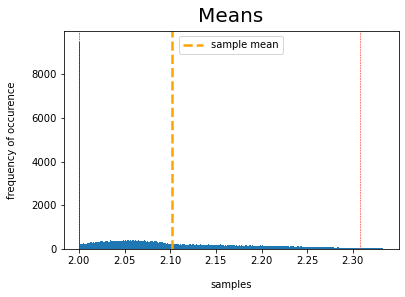

In [7]:
plt.hist(result_list,bins=500)

plt.title("Means", y=1.015, fontsize=20)
plt.axvline(x=sum(result_list)/len(result_list), linestyle='--', linewidth=2.5, label="sample mean", c='orange')
plt.xlabel("samples", labelpad=14)
plt.ylabel("frequency of occurence", labelpad=14)
plt.legend();

result_list.sort()

plt.axvline(x=result_list[int(len(result_list)*0.01)], linestyle='--', linewidth=0.5, label="1%", c='b')
plt.axvline(x=result_list[int(len(result_list)*0.99)], linestyle='--', linewidth=0.5, label="99%", c='r')


plt.show()

In [8]:
training_supervised_label=np.array(training_supervised_label)
print(training_supervised_label)
devided_number = 10
tensor_sample_list,indices = torch.sort(torch.rand(devided_number,requires_grad=True).to(dev))  # random ideas\n
print(tensor_sample_list)

[[0.66666667 1.10133002 1.23365922]
 [0.66666667 0.74811844 0.85955339]
 [0.80437078 0.91605042 1.70323301]
 ...
 [0.66677599 1.1145065  1.23867181]
 [0.66666667 0.66666667 0.66666667]
 [0.66666667 0.66666667 0.69803631]]
tensor([0.0891, 0.1395, 0.2100, 0.2705, 0.3000, 0.4371, 0.5715, 0.8371, 0.8386,
        0.8466], device='cuda:0', grad_fn=<SortBackward>)


In [9]:
print(cdf(tensor_sample_list,Prior_Distribution))
print(cdf(tensor_sample_list,"normal"))

tensor([0.0162, 0.0529, 0.1829, 0.3832, 0.4992, 0.9147, 0.9967, 1.0000, 1.0000,
        1.0000], device='cuda:0', grad_fn=<DivBackward0>)
tensor([0.0162, 0.0529, 0.1829, 0.3832, 0.4992, 0.9147, 0.9967, 1.0000, 1.0000,
        1.0000], device='cuda:0', grad_fn=<DivBackward0>)


In [10]:
def weight_init(m):
    if isinstance(m, torch.nn.Conv2d):
        torch.nn.init.xavier_normal_(m.weight)
        torch.nn.init.zeros_(m.bias)
    elif isinstance(m, torch.nn.Linear):
        torch.nn.init.normal_(m.weight, mean=0.0, std=0.2)
        torch.nn.init.normal_(m.bias, mean=0.0, std=0.01)



def redistribution_value_function(input_tensor):
    S = torch.max(torch.sum(input_tensor), torch.ones(1).to(dev))
    temp_list = []

    for i in range(Agent_number_n):
        temp = []

        for j in range(Agent_number_n):
            if(i != j):
                temp .append(input_tensor[j])

        temp = torch.stack(temp)
        temp_list.append(temp)
    return torch.stack(temp_list), S


class Net(torch.nn.Module):
    def __init__(self):

        super(Net, self).__init__()

        self.input_dim = (Agent_number_n-1)
        self.hidden_dim = 100
        self.output_dim = 1
        self.hidden_layer_count = 6

        current_dim = self.input_dim
        self.layers = torch.nn.ModuleList()
        for i in range(self.hidden_layer_count):
            self.layers.append(torch.nn.Linear(current_dim, self.hidden_dim))
            current_dim = self.hidden_dim
        self.layers.append(torch.nn.Linear(current_dim, self.output_dim))

    def calculate(self, value_list):
        h = value_list
        for layer in self.layers:
            h = torch.relu(layer(h))
        return h

    def forward(self, input_list, input_label, input_data):
        global iteration, echo, target_order
        loss1 = 0
        loss2 = 0
        input_list = torch.from_numpy(
            np.array(input_list)).to(dev).type(torch.float32)

        input_data = torch.from_numpy(
            np.array(input_data)).to(dev).type(torch.float32)
        
        input_label = torch.from_numpy(
            np.array(input_label)).to(dev).type(torch.float32)
        
        
        random_index = random.randint(0, Agent_number_n-1)
        tensor_sample_list,indices = torch.sort(torch.rand(devided_number,requires_grad=True).to(dev))
     
        tensor_sample = torch.rand(devided_number,requires_grad=True)[0].to(dev)
    
        input_data_temp = input_data.detach().clone()
        
        input_data_temp[random_index] = tensor_sample

        value_list_tensor, S_tensor = redistribution_value_function(
            input_data_temp)
       
        h_list = []
        for i in range(Agent_number_n):
            h = self.calculate(
                value_list_tensor[i].to(dev).type(torch.float32))
            h_list.append(h)
            
        S_tensor = S_tensor.detach().to(dev).type(torch.float32)
#        S_tensor = S_tensor.to(dev).type(torch.float32)
        sum_h = torch.sum(torch.cat(h_list)).to(dev)
        
        temp_loss1 = torch.where((Agent_number_n-1)*S_tensor > sum_h,
                 torch.square(((Agent_number_n-1)*S_tensor - sum_h)),
                 torch.zeros(1).to(dev)
              )

        temp_loss2 = torch.where((Agent_number_n-Alpha)*S_tensor < sum_h,
                    torch.square((sum_h-(Agent_number_n-Alpha)*S_tensor))/10000,
                    torch.zeros(1).to(dev)
                  )


        loss1 = temp_loss1 * pdf(tensor_sample, Prior_Distribution)
        loss2 = temp_loss2 * pdf(tensor_sample, Prior_Distribution)
                
        return loss1, loss2

In [11]:
random.seed(200)
torch.manual_seed(256)
net  = Net()
net.apply(weight_init)
#net = torch.load("save/Deep_learning_F_normal_3_1")
net.to(dev)

#optimizer = opt.RMSprop(net.parameters(), lr=0.00001)
#optimizer = opt.SGD(net.parameters(), lr=0.00005)
optimizer = opt.Adam(net.parameters(), lr=LR)
#optimizer = opt.Adadelta(net.parameters(), lr=1.0)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.9)

In [12]:
for iteration in range(int(echo)):
    # offender_types = []
    # defender_types = []
    
    
    X_train_list = []
    temp_number = 0
    total_batch_loss = 0 
    while(temp_number<len(training_data)-1):
        
        loss2_list = []
        loss1_sum = 0
        loss2_sum = 0
        denominator = 0
        for index in range(temp_number, min(BATCH_SIZE+temp_number,len(training_data))):
            h_loss1,h_loss2 = net(training_data[index],training_label[index],training_data_all[index])
            denominator += 1
            loss1_sum += h_loss1
            loss2_sum += h_loss2
            
        loss_sum = torch.sum(loss1_sum + loss2_sum)
        loss = (loss_sum) / denominator 
        total_batch_loss +=float(loss_sum)
        optimizer.zero_grad()
        
        loss.backward()
        
        optimizer.step()
        
        temp_number = index
        
        if(random.random()<=0.01):
            print(temp_number,loss,float(loss1_sum),float(loss2_sum))


    print("batch iteration", iteration)
    print("batch_loss: %.2f " % (total_batch_loss/len(training_data)))
    
    print()
    print()
    scheduler.step()
    print(optimizer)

3780 tensor(0.0015, device='cuda:0', grad_fn=<DivBackward0>) 0.0 0.09640970081090927
8883 tensor(0.0031, device='cuda:0', grad_fn=<DivBackward0>) 0.0 0.19630974531173706
15309 tensor(0.0329, device='cuda:0', grad_fn=<DivBackward0>) 0.0 2.1053812503814697
47880 tensor(0.0002, device='cuda:0', grad_fn=<DivBackward0>) 0.0 0.01201100554317236
50967 tensor(0.0008, device='cuda:0', grad_fn=<DivBackward0>) 0.0 0.05248069763183594
60102 tensor(0.0062, device='cuda:0', grad_fn=<DivBackward0>) 0.0 0.3937125504016876
65142 tensor(9.2236e-05, device='cuda:0', grad_fn=<DivBackward0>) 0.0 0.005903118290007114
77805 tensor(0.0022, device='cuda:0', grad_fn=<DivBackward0>) 0.0 0.14078600704669952
89208 tensor(0.0004, device='cuda:0', grad_fn=<DivBackward0>) 0.0 0.023933779448270798
95130 tensor(0.0001, device='cuda:0', grad_fn=<DivBackward0>) 3.114391802228056e-06 0.007640880066901445
96327 tensor(5.5709e-05, device='cuda:0', grad_fn=<DivBackward0>) 0.0 0.003565385704860091
98532 tensor(5.0275e-05, dev

3906 tensor(9.5008e-06, device='cuda:0', grad_fn=<DivBackward0>) 4.754287510877475e-05 0.0005605054320767522
17766 tensor(7.3066e-06, device='cuda:0', grad_fn=<DivBackward0>) 1.4244443695091533e-22 0.0004676231765188277
22680 tensor(4.1971e-05, device='cuda:0', grad_fn=<DivBackward0>) 0.0 0.0026861759833991528
27405 tensor(5.2519e-05, device='cuda:0', grad_fn=<DivBackward0>) 0.00014639587607234716 0.003214822616428137
28665 tensor(1.6552e-05, device='cuda:0', grad_fn=<DivBackward0>) 2.5449480745010078e-05 0.0010338944848626852
36855 tensor(3.7076e-05, device='cuda:0', grad_fn=<DivBackward0>) 0.0 0.0023728907108306885
38367 tensor(2.1937e-05, device='cuda:0', grad_fn=<DivBackward0>) 4.709264323442784e-14 0.0014039550442248583
59787 tensor(4.1798e-05, device='cuda:0', grad_fn=<DivBackward0>) 0.0 0.002675072755664587
63819 tensor(6.8191e-06, device='cuda:0', grad_fn=<DivBackward0>) 0.0 0.0004364233464002609
64638 tensor(1.1624e-05, device='cuda:0', grad_fn=<DivBackward0>) 3.62810010301473

72639 tensor(4.0983e-06, device='cuda:0', grad_fn=<DivBackward0>) 3.1946963782535e-19 0.0002622880565468222
76419 tensor(8.0524e-06, device='cuda:0', grad_fn=<DivBackward0>) 0.0 0.0005153552046976984
81333 tensor(6.9266e-06, device='cuda:0', grad_fn=<DivBackward0>) 0.0 0.00044330331729725003
94752 tensor(1.3078e-05, device='cuda:0', grad_fn=<DivBackward0>) 5.555666007239779e-07 0.0008364456589333713
95319 tensor(8.2283e-06, device='cuda:0', grad_fn=<DivBackward0>) 0.0 0.0005266091320663691
batch iteration 9
batch_loss: 0.00 


Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    initial_lr: 0.001
    lr: 0.0003486784401
    weight_decay: 0
)


In [13]:
torch.save(net, "save/Deep_learning_F_normal_3_1")

In [14]:
denominator = 0
result_list = []
for index in range(len(testing_data)):
    h_list = []
    for i in range(Agent_number_n):
        h = net.calculate(torch.tensor(testing_data[index][i]).cuda().type(torch.float32))
        h_list.append(float(h))
    
    #print(sum(h_list),h_list,sum(h_list)/testing_label[index])
    result_list.append(sum(h_list)/testing_label[index])
    

print(max(result_list),min(result_list),max(result_list)-min(result_list),sum(result_list)/len(result_list))

2.9680498838424683 2.0892768770861765 0.8787730067562918 2.2474132355458356


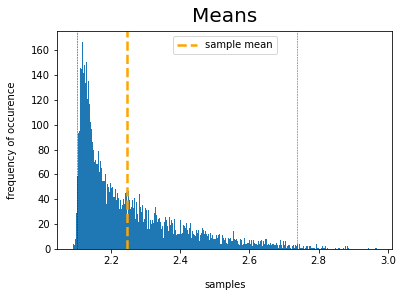

In [15]:
plt.hist(result_list,bins=500)

plt.title("Means", y=1.015, fontsize=20)
plt.axvline(x=sum(result_list)/len(result_list), linestyle='--', linewidth=2.5, label="sample mean", c='orange')
plt.xlabel("samples", labelpad=14)
plt.ylabel("frequency of occurence", labelpad=14)
plt.legend();

result_list.sort()

plt.axvline(x=result_list[int(len(result_list)*0.01)], linestyle='--', linewidth=0.5, label="1%", c='b')
plt.axvline(x=result_list[int(len(result_list)*0.99)], linestyle='--', linewidth=0.5, label="99%", c='r')


plt.show()

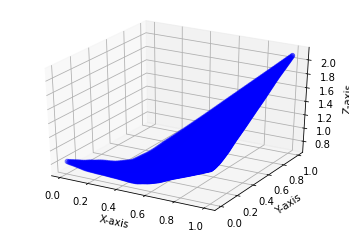

In [16]:

# Create the figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# Generate the values
x_vals = []
y_vals = []
z_vals = []
x_ = np.linspace(0.0,1.0,101)
y_ = np.linspace(0.0,1.0,101)

result_list = []
for i in range(len(x_)):
    for j in range(0,i):
        h = net.calculate(torch.tensor([x_[i],y_[j]]).cuda().type(torch.float32))
        x_vals.append(x_[i])
        y_vals.append(y_[j])
        z_vals.append(float(h))


# Plot the values
ax.scatter(x_vals, y_vals, z_vals, c = 'b', marker='o')


ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')



plt.show()

In [17]:
fig = px.scatter_3d(z=z_vals, x=x_vals, y=y_vals)

fig.show()

In [18]:
# def h_function(input_list):

#     h = max(sum(input_list),2/3) + 1/2 * max(sum(input_list),1) - 1/2 * max(input_list[0],2/3) - 1/6
#     return h

def h_function(input_list):
    if(sum(input_list)>=2/3):
        h = sum(input_list)
    else:
        h = 2/3
    return h   
                
x_list2 = []
y_list2 = []
z_list2 = []
result_list = []
for index in range(len(training_data)):
    h_list = []
    for i in range(Agent_number_n):
        x_list2.append(training_data[index][i][0])
        y_list2.append(training_data[index][i][1])
        h = h_function(training_data[index][i])
        z_list2.append(float(h))
        h_list.append(float(h))
    result_list.append(sum(h_list)/training_label[index]) 
    
    
print(max(result_list), min(result_list), max(result_list)-min(result_list),sum(result_list)/len(result_list))
fig = px.scatter_3d(z=z_list2[:10000], x=x_list2[:10000], y=y_list2[:10000])

fig.show()

2.630786771746618 1.9999999999999996 0.6307867717466182 2.056865348997966


In [19]:
# def h_function(input_list):

#     h = max(sum(input_list),2/3) + 1/2 * max(sum(input_list),1) - 1/2 * max(input_list[0],2/3) - 1/6
#     return h

def h_function(input_list):
    if(sum(input_list)>=2/3):
        h = sum(input_list)
    else:
        h = 2/3-sum(input_list)*1/16+1/24
    return h   
                
x_list2 = []
y_list2 = []
z_list2 = []
result_list = []
for index in range(len(training_data)):
    h_list = []
    for i in range(Agent_number_n):
        x_list2.append(training_data[index][i][0])
        y_list2.append(training_data[index][i][1])
        h = h_function(training_data[index][i])
        z_list2.append(float(h))
        h_list.append(float(h))
    result_list.append(sum(h_list)/training_label[index]) 
    
    
print(max(result_list), min(result_list), max(result_list)-min(result_list),sum(result_list)/len(result_list))
fig = px.scatter_3d(z=z_list2[:10000], x=x_list2[:10000], y=y_list2[:10000])

fig.show()

2.6702109449807816 1.9999999999999996 0.670210944980782 2.0656124746394475


In [20]:
# def h_function(input_list):

#     h = max(sum(input_list),2/3) + 1/2 * max(sum(input_list),1) - 1/2 * max(input_list[0],2/3) - 1/6
#     return h

def h_function(input_list):

    h = max(sum(input_list),2/3) + 1/2 * max(sum(input_list),1) - 1/2 * max(input_list[0],2/3) - 1/6
    return h   
                
x_list1 = []
y_list1 = []
z_list1 = []
result_list = []
for index in range(len(training_data)):
    h_list = []
    for i in range(Agent_number_n):
        x_list1.append(training_data[index][i][0])
        y_list1.append(training_data[index][i][1])
        h = h_function(training_data[index][i])
        z_list1.append(float(h))
        h_list.append(float(h))
    result_list.append(sum(h_list)/training_label[index]) 
    
    
print(max(result_list), min(result_list), max(result_list)-min(result_list),sum(result_list)/len(result_list))
fig = px.scatter_3d(z=z_list1[:10000], x=x_list1[:10000], y=y_list1[:10000])

fig.show()

2.3332670139555187 2.0 0.3332670139555187 2.102024080450688


In [21]:
fig = px.scatter_3d(z=z_list[:10000], x=x_list[:10000], y=y_list[:10000])

fig.show()

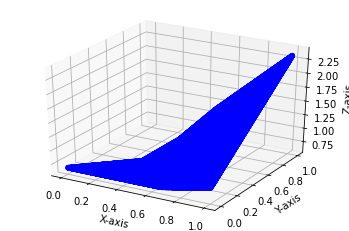

In [22]:
# Create the figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# Generate the values

# Plot the values
ax.scatter(x_list, y_list, z_list, c = 'b', marker='o')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')

plt.show()

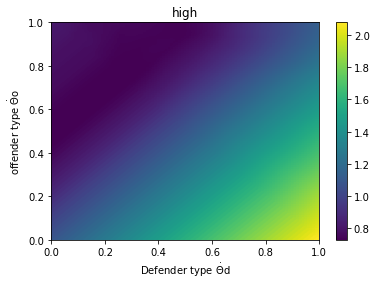

In [23]:
o_frame = np.linspace(0.0,1.0,101)
    
#o* = argmax_o { (2 * theta_O - 400)(o-o*o/2) + (2 * theta_D - 15)(1-o)  }

grid_x, grid_y = np.mgrid[0:1:400j, 0:1:400j]

points =np.reshape([x_vals,y_vals],(2,-1))

points = np.transpose(points)

grid_z2 = griddata(points, z_vals, (grid_x, grid_y), method='nearest')


im =plt.imshow(grid_z2.T, extent=(0,1,0,1) , aspect='auto',interpolation='bilinear')
plt.colorbar(im)
plt.title('high')
plt.xlabel(r"Defender type $\dot{\Theta}$d")
plt.ylabel(r"offender type $\dot{\Theta}$o")
plt.show()